In [1]:
### Two Game of Life implementations that I stole
## https://jakevdp.github.io/blog/2013/08/07/conways-game-of-life/



import numpy as np

def life_step_1(X):
    """Game of life step using generator expressions"""
    nbrs_count = sum(np.roll(np.roll(X, i, 0), j, 1)
                     for i in (-1, 0, 1) for j in (-1, 0, 1)
                     if (i != 0 or j != 0))
    return (nbrs_count == 3) | (X & (nbrs_count == 2))

def life_step_2(X):
    """Game of life step using scipy tools"""
    from scipy.signal import convolve2d
    nbrs_count = convolve2d(X, np.ones((3, 3)), mode='same', boundary='wrap') - X
    return (nbrs_count == 3) | (X & (nbrs_count == 2))
    
life_step = life_step_1

In [5]:
%pylab inline
# %matplotlib inline

Populating the interactive namespace from numpy and matplotlib


/home/tms/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['rc']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [6]:
# %matplotlib inline
from matplotlib import rc
from IPython.display import HTML
from matplotlib import animation


In [7]:
### Animating the Game of Life using JSAnimation and Ipython (also from jakevdp)


# JSAnimation import available at https://github.com/jakevdp/JSAnimation
# from JSAnimation.IPython_display import display_animation, anim_to_html
from matplotlib import animation

def life_animation(X, figsize=(5,5), frames=10, interval=300, mode='loop'):
    """Produce a Game of Life Animation
    
    Parameters
    ----------
    X : array_like
        a two-dimensional numpy array showing the game board
    dpi : integer
        the number of dots per inch in the resulting animation.
        This controls the size of the game board on the screen
    frames : integer
        The number of frames to compute for the animation
    interval : float
        The time interval (in milliseconds) between frames
    mode : string
        The default mode of the animation.  Options are ['loop'|'once'|'reflect']
    """
    X = np.asarray(X)
    assert X.ndim == 2
    X = X.astype(bool)
    
    X_blank = np.zeros_like(X)
#     figsize = (X.shape[1] * 1. / dpi, X.shape[0] * 1. / dpi)

    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1], xticks=[], yticks=[], frameon=False)
    im = ax.imshow(X, cmap=plt.cm.binary, interpolation='nearest')
    im.set_clim(-0.05, 1)  # Make background gray

    # initialization function: plot the background of each frame
    def init():
        im.set_data(X_blank)
        return (im,)

    # animation function.  This is called sequentially
    def animate(i):
        im.set_data(animate.X)
        animate.X = life_step(animate.X)
        return (im,)
    animate.X = X

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=interval)
    
    #print anim_to_html(anim)
    return anim

/home/tms/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  # This is added back by InteractiveShellApp.init_path()


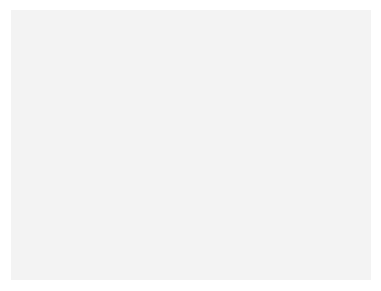

In [8]:


np.random.seed(0)
X = np.zeros((30, 40), dtype=bool)
r = np.random.random((10, 20))
X[10:20, 10:30] = (r > 0.75)
anim = life_animation(X, frames=40, mode='once')


HTML(anim.to_jshtml())

/home/tms/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  # This is added back by InteractiveShellApp.init_path()


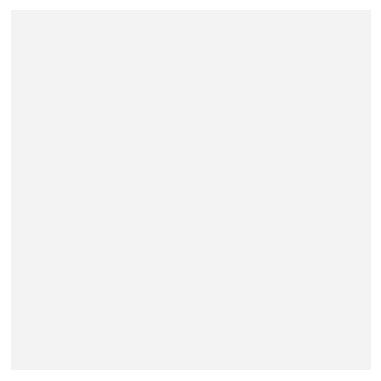

In [28]:
one_dim_breeder = [0] + [1]*8 + [0] + [1]*5 + [0]*3 + [1]*3 + [0]*6 + [1]*7 + [1]*5 + [0]

np.random.seed(0)
X = np.zeros((50, 50), dtype=bool)
X[1, 1:41] = one_dim_breeder
one_dim_breeder.reverse()
X[49, 10:50] = one_dim_breeder

anim = life_animation(X, frames=500, mode='once')


HTML(anim.to_jshtml())

In [ ]:
import requests
max_url = 'http://www.conwaylife.com/patterns/max.cells'
r = requests.get(max_url)

max_pattern = r.text.split('\r\n')[4:-1]
max_pattern

In [44]:
array = []
max_width = 0

for line in max_pattern:
    row = []
    for position in line:
        if position == '.':
            row.append(False)
        else:
            row.append(True)
    if len(row) > max_width:
            max_width = len(row)
        
    array.append(row)

for row in array:
    if len(row) < max_width:
        pad_length = max_width - len(row)
        row += [0] * (pad_length)
    
array = np.array(array)

In [46]:
array.shape

(27, 27)

/home/tms/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  # This is added back by InteractiveShellApp.init_path()


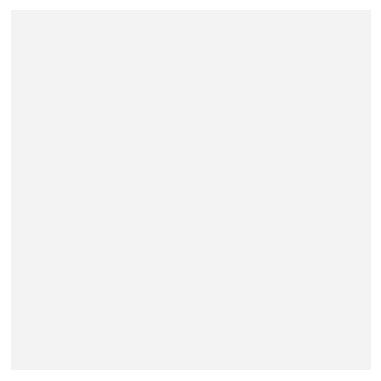

In [48]:
np.random.seed(0)
X = np.zeros((50, 50), dtype=bool)
X[10:37, 10:37] = array

anim = life_animation(X, frames=500, mode='once')


HTML(anim.to_jshtml())

Install opencv.
Best option is `pip install opencv-python`

In [4]:


import cv2
tree = cv2.imread("tree.jpg")
# print(tree)

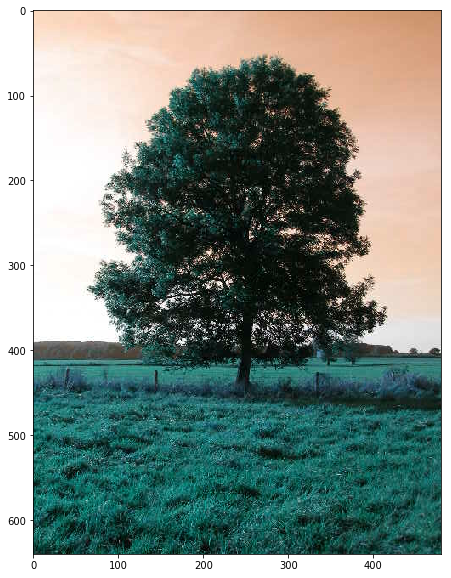

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (10,10))
plt.imshow(tree, aspect='equal')



In [6]:
## make a basic grid version in matplotlib

from matplotlib import cm


In [9]:
expanded = np.zeros((100,100))
data = np.random.random((10,10))
data = data * 2 - 1
index = 0

for x_square in range(10):
    for y_square in range(10):
        ## fill square in expanded
        local_y = 10 * y_square
        local_x = 10 * x_square

        for x in range(local_x, local_x + 10):
            for y in range(local_y, local_y + 10):
                expanded[x, y] = data[x_square, y_square]

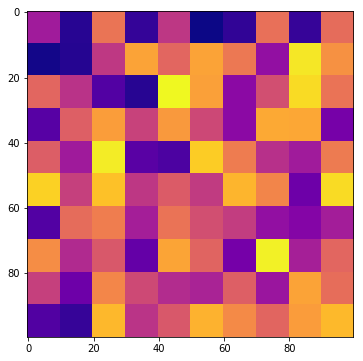

In [10]:
fig, ax = plt.subplots(figsize=(6,6))
plt.imshow(expanded, cmap='plasma')

In [11]:
def decimal_mod(dec, modulo):
    intg = int(dec * 100)
    alive = intg % modulo == 0
    return alive

t = np.vectorize(decimal_mod)

In [12]:
expanded = np.zeros((100,100))
data = np.random.random((10,10))
index = 0

for x_square in range(10):
    for y_square in range(10):
        ## fill square in expanded
        local_y = 10 * y_square
        local_x = 10 * x_square

        for x in range(local_x, local_x + 10):
            for y in range(local_y, local_y + 10):
                expanded[x, y] = data[x_square, y_square]

start_grid = t(expanded, 5)
steps = []
images = []
step = start_grid
for i in range(1000):
    
    step = life_step(step)
    change_points = expanded[step]
    i = np.argsort(np.arange(0,len(change_points)))
    temp = np.zeros_like(expanded)
    temp[step] = expanded[np.mod(np.where(step)[0] + 1,100),np.where(step)[1]]
    expanded[step] = expanded[np.mod(np.where(step)[0] + 1,100),np.where(step)[1]]
    steps.append(temp)
    temp_image = expanded.copy()
    images.append(temp_image)
    
    

/home/tms/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  # This is added back by InteractiveShellApp.init_path()


In [14]:
from matplotlib import animation

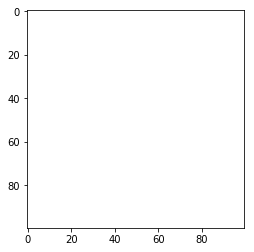

In [15]:
%matplotlib inline
from matplotlib import rc
from IPython.display import HTML


fig = plt.figure()

ims = [[plt.imshow(s,animated=True)] for s in steps]
# ims = [[plt.imshow(s,animated=True)] for s in images]


ani = animation.ArtistAnimation(fig, ims, interval=50, 
                                blit=True, repeat_delay=1000)


In [ ]:

HTML(ani.to_jshtml())

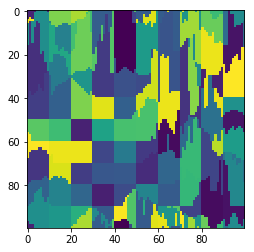

In [20]:
fig = plt.figure()
ims = [[plt.imshow(s,animated=True)] for s in images]


ani2 = animation.ArtistAnimation(fig, ims, interval=50, 
                                blit=True, repeat_delay=1000)
HTML(ani2.to_jshtml())

### TODO
- make life-animation a function
- reimplement basic life on grid (top jakevdp function)
- implement different activation/transformation schemes

### possible transformation schemes
- transformation based on the change to the cell in that step - if it is born, it dies, it stays alive or it stays dead
- colour flipping
- rgb transforming (as below with tree)
- final version (as a class?) which loads an image, runs life, returns the final output or (on request) the animation

In [9]:
tree.shape

(640, 480, 3)

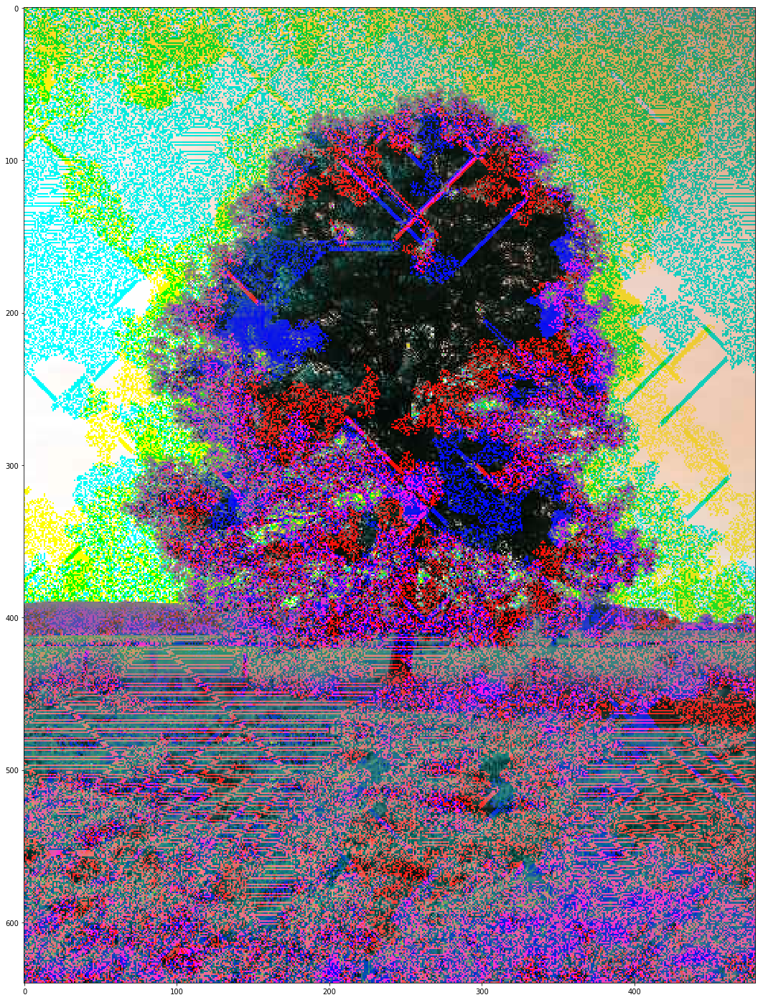

In [46]:
### A really basic go at using game of life to bend an image


tree2 = tree

tree2_red = tree2[:,:,0]

tree2_green = tree2[:,:,1]

tree2_blue = tree2[:,:,2]


tree_of_life_red = (tree[:,:,0]<130)

tree_of_life_blue = (tree[:,:,2]<130)

tree_of_life_green = (tree[:,:,1]<130)

fig, ax = plt.subplots(figsize = (25,25))

for i in range(30):
        
    plt.imshow(tree2)
    
    for i in range(10):
        tree_of_life_red = life_step(tree_of_life_red)

        tree2_red[tree_of_life_red] = 255 - tree[:,:,0][tree_of_life_red]

        tree_of_life_blue = life_step(tree_of_life_blue)

        tree2_blue[tree_of_life_blue] = 255 - tree[:,:,2][tree_of_life_blue]

        tree_of_life_green = life_step(tree_of_life_green)

        tree2_blue[tree_of_life_green] = 255 - tree[:,:,1][tree_of_life_green]
    
    
    

